In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[]

In [ ]:
from PIL import Image
import os
from PIL import Image, ImageOps

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [ ]:
from skimage.metrics import structural_similarity as ssim
import cv2

In [ ]:
class ConvLayer(tf.keras.layers.Layer):
    def __init__(self, n_layers, filters=50, kernel_size=(3, 3), activation=tf.nn.relu, **kwargs):
        super().__init__(**kwargs)
        self.convs = []
        for conv in range(n_layers):
            self.convs.append(
                tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, activation=activation, padding='same')
            )

    def call(self, input_tensor, training=False):
        x = self.convs[0](input_tensor, training=training)
        for i in range(1, len(self.convs)):
            x = self.convs[i](x, training=training)

        return x

In [ ]:
class PrepLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv_layer_4_3x3 = ConvLayer(4, filters=50, kernel_size=(3, 3), activation=tf.nn.relu)
        self.conv_layer_4_4x4 = ConvLayer(4, filters=50, kernel_size=(4, 4), activation=tf.nn.relu)
        self.conv_layer_4_5x5 = ConvLayer(4, filters=50, kernel_size=(5, 5), activation=tf.nn.relu)

        self.concat_1 = tf.keras.layers.Concatenate(axis=3)

        self.conv_1_3x3 = ConvLayer(1, filters=50, kernel_size=(3, 3), activation=tf.nn.relu)
        self.conv_1_4x4 = ConvLayer(1, filters=50, kernel_size=(4, 4), activation=tf.nn.relu)
        self.conv_1_5x5 = ConvLayer(1, filters=50, kernel_size=(5, 5), activation=tf.nn.relu)

        self.concat_2 = tf.keras.layers.Concatenate(axis=3)

    def call(self, input_tensor, training=False):
        prep_input = tf.keras.layers.Rescaling(1./255, input_shape=input_tensor.shape)(input_tensor)
        conv_4_3x3 = self.conv_layer_4_3x3(prep_input, training=training)
        conv_4_4x4 = self.conv_layer_4_4x4(prep_input, training=training)
        conv_4_5x5 = self.conv_layer_4_5x5(prep_input, training=training)

        concat_1 = self.concat_1([conv_4_3x3, conv_4_4x4, conv_4_5x5])

        conv_1_3x3 =  self.conv_1_3x3(concat_1)
        conv_1_4x4 =  self.conv_1_4x4(concat_1)
        conv_1_5x5 =  self.conv_1_5x5(concat_1)

        return self.concat_2([conv_1_3x3, conv_1_4x4, conv_1_5x5])

In [ ]:
class HideLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.prep_layer = PrepLayer()
        self.concat_1 = tf.keras.layers.Concatenate(axis=3)

        self.conv_layer_4_3x3 = ConvLayer(4, filters=50, kernel_size=(3, 3), activation=tf.nn.relu)
        self.conv_layer_4_4x4 = ConvLayer(4, filters=50, kernel_size=(4, 4), activation=tf.nn.relu)
        self.conv_layer_4_5x5 = ConvLayer(4, filters=50, kernel_size=(5, 5), activation=tf.nn.relu)

        self.concat_2 = tf.keras.layers.Concatenate(axis=3)

        self.conv_1_3x3 = ConvLayer(1, filters=50, kernel_size=(3, 3), activation=tf.nn.relu)
        self.conv_1_4x4 = ConvLayer(1, filters=50, kernel_size=(4, 4), activation=tf.nn.relu)
        self.conv_1_5x5 = ConvLayer(1, filters=50, kernel_size=(5, 5), activation=tf.nn.relu)

        self.concat_3 = tf.keras.layers.Concatenate(axis=3)

        self.conv_1_1x1 = ConvLayer(1, filters=3, kernel_size=(1, 1), activation=tf.nn.relu)

    def call(self, input_tensor, training=False):
        prep_input = input_tensor[0]
        hide_input = tf.keras.layers.Rescaling(1./255, input_shape=input_tensor[1].shape)(input_tensor[1])
        concat_1 = self.concat_1([prep_input, hide_input])

        conv_4_3x3 = self.conv_layer_4_3x3(concat_1, training=training)
        conv_4_4x4 = self.conv_layer_4_4x4(concat_1, training=training)
        conv_4_5x5 = self.conv_layer_4_5x5(concat_1, training=training)

        concat_2 = self.concat_2([conv_4_3x3, conv_4_4x4, conv_4_5x5])

        conv_1_3x3 =  self.conv_1_3x3(concat_2)
        conv_1_4x4 =  self.conv_1_4x4(concat_2)
        conv_1_5x5 =  self.conv_1_5x5(concat_2)

        concat_3 = self.concat_3([conv_1_3x3, conv_1_4x4, conv_1_5x5])

        return self.conv_1_1x1(concat_3)

In [ ]:
class RevealLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv_layer_4_3x3 = ConvLayer(4, filters=50, kernel_size=(3, 3), activation=tf.nn.relu)
        self.conv_layer_4_4x4 = ConvLayer(4, filters=50, kernel_size=(4, 4), activation=tf.nn.relu)
        self.conv_layer_4_5x5 = ConvLayer(4, filters=50, kernel_size=(5, 5), activation=tf.nn.relu)

        self.concat_1 = tf.keras.layers.Concatenate(axis=3)

        self.conv_1_3x3 = ConvLayer(1, filters=50, kernel_size=(3, 3), activation=tf.nn.relu)
        self.conv_1_4x4 = ConvLayer(1, filters=50, kernel_size=(4, 4), activation=tf.nn.relu)
        self.conv_1_5x5 = ConvLayer(1, filters=50, kernel_size=(5, 5), activation=tf.nn.relu)

        self.concat_2 = tf.keras.layers.Concatenate(axis=3)

        self.conv_1_1x1 = ConvLayer(1, filters=3, kernel_size=(1, 1), activation=tf.nn.relu)

    def call(self, input_tensor, training=False):

        conv_4_3x3 = self.conv_layer_4_3x3(input_tensor, training=training)
        conv_4_4x4 = self.conv_layer_4_4x4(input_tensor, training=training)
        conv_4_5x5 = self.conv_layer_4_5x5(input_tensor, training=training)

        concat_1 = self.concat_1([conv_4_3x3, conv_4_4x4, conv_4_5x5])

        conv_1_3x3 =  self.conv_1_3x3(concat_1)
        conv_1_4x4 =  self.conv_1_4x4(concat_1)
        conv_1_5x5 =  self.conv_1_5x5(concat_1)

        concat_2 = self.concat_2([conv_1_3x3, conv_1_4x4, conv_1_5x5])

        return self.conv_1_1x1(concat_2)

In [ ]:
class MyModel(tf.keras.models.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.prep_layer = PrepLayer()
        self.hide_layer = HideLayer()
        self.reveal_layer = RevealLayer()

    def call(self, input_tensor, training=False):
        secret = input_tensor[0]
        cover = input_tensor[1]
        prep_output = self.prep_layer(secret)
        hide_output = self.hide_layer([prep_output, cover])
        reveal_output = self.reveal_layer(hide_output)

        return  reveal_output, hide_output

    def model(self, inputs):
        return tf.keras.Model(inputs=inputs, outputs=self.call(inputs))

In [ ]:
class StenographyLoss(tf.keras.losses.Loss):
    def __init__(self, beta=1.0, **kwargs):
        super().__init__(**kwargs)
        self.beta = beta

    def call(self, y_true, y_pred):
        beta = tf.constant(self.beta, name='beta')

        secret_true = y_true[0]
        secret_pred = y_pred[0]

        cover_true = y_true[1]
        cover_pred = y_pred[1]

        secret_mse = tf.losses.MSE(secret_true, secret_pred)
        cover_mse = tf.losses.MSE(cover_true, cover_pred)

        return tf.reduce_mean(cover_mse + beta * secret_mse)/12,288

In [ ]:
complete_model = tf.keras.models.load_model(
    '/content/drive/MyDrive/Complete_model_IIITN.h5',
    custom_objects={
        'PrepLayer': PrepLayer,
        'HideLayer': HideLayer,
        'RevealLayer': RevealLayer,
        'StenographyLoss': StenographyLoss
    }
)

In [ ]:
complete_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 secret_input (InputLayer)   [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 prep_layer (PrepLayer)      (None, 64, 64, 150)          758250    ['secret_input[0][0]']        
                                                                                                  
 cover_input (InputLayer)    [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 hide_layer (HideLayer)      (None, 64, 64, 3)            1133703   ['prep_layer[0][0]',          
                                                                     'cover_input[0][0]']     

# **DONT RUN THIS SECTION**

In [ ]:
def peak_signal_noise_ratio(y_true, y_pred):
    return tf.image.psnr(y_pred, y_true, max_val=255.0)

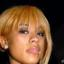

In [ ]:
secret = Image.open('/content/003328.jpg').convert('RGB')
secret

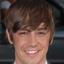

In [ ]:
cover = Image.open('/content/003646.jpg').convert('RGB')
cover

In [ ]:
revealed, cover_with_secret = complete_model.predict(
    [np.expand_dims(np.array(secret), axis=0), np.expand_dims(np.array(cover), axis=0)]
)

1/1 [==============================] - 1s 1s/step


In [ ]:
cover_with_secret_img = Image.fromarray(np.array(cover_with_secret[0], dtype=np.uint8), 'RGB')

In [ ]:
secret_rev_img = Image.fromarray(np.array(revealed[0], dtype=np.uint8), 'RGB')

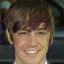

In [ ]:
cover_with_secret_img

In [ ]:
from skimage.metrics import structural_similarity as ssim
import cv2

In [ ]:
cover_with_secret_img.save('coverWSecre.jpg')

In [ ]:
secret_rev_img.save('secretRev.jpg')

In [ ]:
image1_path = "/content/secretRev.jpg"
image2_path = "/content/003328.jpg"
ssim_index = get_ssim_index(image1_path, image2_path)
print("SSIM Index of secret image and reveled secret image:", ssim_index)

SSIM Index of secret image and reveled secret image: 0.9186506475320293


In [ ]:
image1_path = "/content/coverWSecre.jpg"
image2_path = "/content/003646.jpg"
ssim_index = get_ssim_index( image2_path,image1_path)
print("SSIM Index of cover image and cover with secret image:", ssim_index)

SSIM Index of cover image and cover with secret image: 0.9953365974991137


In [ ]:
def get_ssim_index(image1_path, image2_path):
    # Read the images
    image1 = cv2.imread(image1_path)
    image2 = cv2.imread(image2_path)

    # Convert images to grayscale
    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Calculate SSIM index
    index = ssim(gray_image1, gray_image2)

    return index




In [ ]:
# Load original and enhanced images
original = Image.open('/content/003328.jpg').convert('RGB')
enhanced = Image.open('/content/secretRev.jpg').convert('RGB')

# Compute PSNR
psnr_value = psnr(original, enhanced)
print("PSNR of original secret and rev secret :", psnr_value)

PSNR of original secret and rev secret : 29.875465898011917


In [ ]:
original = Image.open('/content/003646.jpg').convert('RGB')
enhanced = Image.open('/content/coverWSecre.jpg').convert('RGB')

# Compute PSNR
psnr_value = psnr(original, enhanced)
print("PSNR of original cover and cover with secret :", psnr_value)

PSNR of original cover and cover with secret : 34.128898975042745


In [ ]:


def psnr(original_image, enhanced_image):
    # Convert images to numpy arrays
    original_array = np.array(original_image)
    enhanced_array = np.array(enhanced_image)

    # Compute mean squared error
    mse = np.mean((original_array - enhanced_array) ** 2)

    # Compute maximum pixel value
    max_pixel = 255.0

    # Compute PSNR
    if mse == 0:
        return float('inf')
    else:
        psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
        return psnr




In [ ]:
im1 = Image.open("/content/secretRev.jpg")

# applying autocontrast method
im2 = ImageOps.autocontrast(im1)



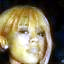

In [ ]:
im2

In [ ]:
im2.save('sRAuto.jpg')

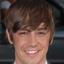

In [ ]:
original

In [ ]:
original = Image.open('/content/003328.jpg').convert('RGB')
enhanced = Image.open('/content/sRAuto.jpg').convert('RGB')

# Compute PSNR
psnr_value = psnr(original, enhanced)
print("PSNR of original cover and cover with secret with auto constrast:", psnr_value)

PSNR of original cover and cover with secret with auto constrast: 28.986966537745573


In [ ]:
image1_path = "/content/sRAuto.jpg"
image2_path = "/content/003328.jpg"
ssim_index = get_ssim_index(image1_path, image2_path)
print("SSIM Index of secret image and reveled secret image:", ssim_index)

SSIM Index of secret image and reveled secret image: 0.9052830447256701


# MODEL TESTING

RUN FROM HERE

In [ ]:




# files = os.listdir('/content/Testfolder/Secret')

# image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

# final_path=[]
# for image_file in image_files:

#     image_path = os.path.join('/content/Testfolder/Secret', image_file)
#     final_path.append(image_path)



In [ ]:
# image_files

['003328.jpg', 'secretRev.jpg', '003646.jpg', 'coverWSecre.jpg', 'sRAuto.jpg']

In [ ]:
# final_path

['/content/Testfolder/Secret/003646.jpg']

In [ ]:
def ImagePathMapping(pathAdress):
  files = os.listdir(pathAdress)

  image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

  final_path=[]
  for image_file in image_files:

      image_path = os.path.join(pathAdress, image_file)
      final_path.append(image_path)

  return final_path


In [ ]:
CoverImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Cover')
SecretImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Secret')

In [ ]:
CoverImages

['/content/drive/MyDrive/Testing Images/Cover/11.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/12.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/15.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/13.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/14.jpg']

In [ ]:
SecretImages

['/content/drive/MyDrive/Testing Images/Secret/24.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/25.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/21.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/23.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/22.jpg']

In [ ]:
def get_ssim_index(image1_path, image2_path):

    image1 = cv2.imread(image1_path)
    image2 = cv2.imread(image2_path)


    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)


    index = ssim(gray_image1, gray_image2)

    return index

In [ ]:
def psnr(original_image, enhanced_image):

    original_array = np.array(original_image)
    enhanced_array = np.array(enhanced_image)


    mse = np.mean((original_array - enhanced_array) ** 2)


    max_pixel = 255.0


    if mse == 0:
        return float('inf')
    else:
        psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
        return psnr

Demo

Test Image ::  1
1/1 [==============================] - 1s 509ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9373211854700962
PSNR of original cover and cover with secret : 33.53796369959606
SSIM Index of Secret image and secret revealed image: 0.9419608587569839
PSNR of original Secret and REv secret: 30.783426300068246


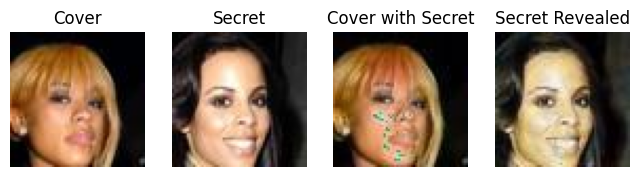

Test Image ::  2
1/1 [==============================] - 1s 520ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.990740774631136
PSNR of original cover and cover with secret : 31.14668427092127
SSIM Index of Secret image and secret revealed image: 0.9603634611358486
PSNR of original Secret and REv secret: 30.129232032025705


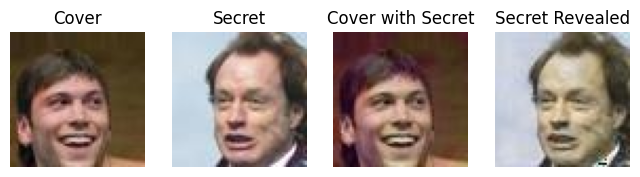

Test Image ::  3
1/1 [==============================] - 1s 528ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9797267032115707
PSNR of original cover and cover with secret : 32.80256337959858
SSIM Index of Secret image and secret revealed image: 0.9559296320766466
PSNR of original Secret and REv secret: 30.36442065924053


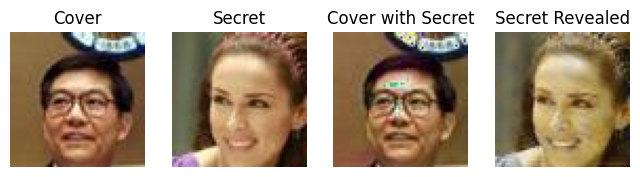

Test Image ::  4
1/1 [==============================] - 1s 531ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.988409253578835
PSNR of original cover and cover with secret : 31.717389278236993
SSIM Index of Secret image and secret revealed image: 0.961704741530259
PSNR of original Secret and REv secret: 30.422810673716945


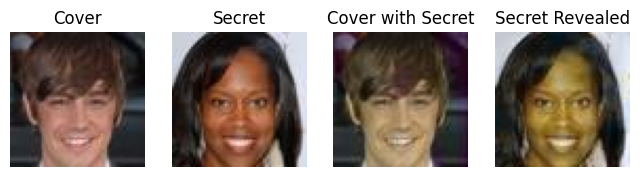

Test Image ::  5
1/1 [==============================] - 1s 550ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9500724060630675
PSNR of original cover and cover with secret : 32.183762206351446
SSIM Index of Secret image and secret revealed image: 0.9015252351431573
PSNR of original Secret and REv secret: 28.227243047274094


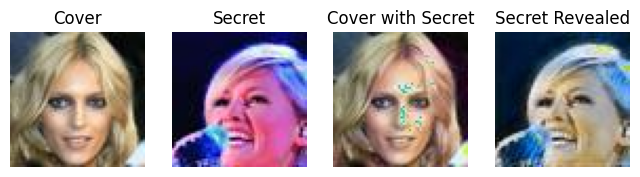

In [ ]:
for index in range(len(CoverImages)):
  print("Test Image :: ",index+1)
  cover = Image.open(CoverImages[index]).convert('RGB')
  secret = Image.open(SecretImages[index]).convert('RGB')

  revealed, cover_with_secret = complete_model.predict(
    [np.expand_dims(np.array(secret), axis=0), np.expand_dims(np.array(cover), axis=0)])
  cover_with_secret_img = Image.fromarray(np.array(cover_with_secret[0], dtype=np.uint8), 'RGB')
  secret_rev_img = Image.fromarray(np.array(revealed[0], dtype=np.uint8), 'RGB')



  cover_with_secret_img.save(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg')
  secret_rev_img.save(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg')

  ## Cover Image Related Values
  image1_path = CoverImages[index]
  image2_path = f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Cover image and Cover with secret secret image:", ssim_index)

  original = Image.open(CoverImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original cover and cover with secret :", psnr_value)

  ## Secret Image Related Values
  image1_path = SecretImages[index]
  image2_path = f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Secret image and secret revealed image:", ssim_index)

  original = Image.open(SecretImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original Secret and REv secret:", psnr_value)

  #Ploting Images

  plot_paths = [CoverImages[index],SecretImages[index],f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg',f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg']#,f'/content/secret_rev_image{index}.jpg'
  fig, axes = plt.subplots(1, 4, figsize=(8, 8))
  labels = ["Cover", "Secret", "Cover with Secret", "Secret Revealed"]
  for i, (image_path,label) in enumerate(zip(plot_paths,labels)):

    image = mpimg.imread(image_path)

    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(label,fontsize=12)


  plt.show()













Test Image ::  1
1/1 [==============================] - 1s 1s/step
SSIM Index of Cover image and Cover with secret secret image: 0.9543589703986161
PSNR of original cover and cover with secret : 33.14003036897607
SSIM Index of Secret image and secret rev image: 0.95456401613235
PSNR of original Secret and REv secret: 30.338125309666527


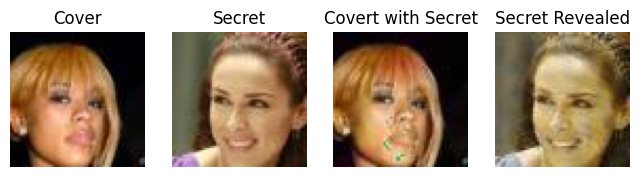

Test Image ::  2
1/1 [==============================] - 0s 431ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9908526834862831
PSNR of original cover and cover with secret : 31.839469561958854
SSIM Index of Secret image and secret rev image: 0.9104944988452177
PSNR of original Secret and REv secret: 28.27928676702397


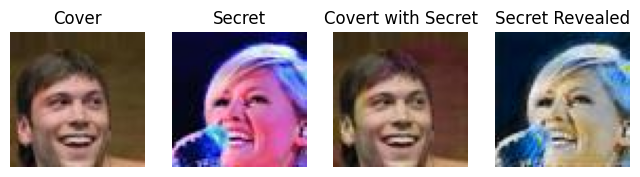

Test Image ::  3
1/1 [==============================] - 0s 440ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.988409253578835
PSNR of original cover and cover with secret : 31.717389278236993
SSIM Index of Secret image and secret rev image: 0.961704741530259
PSNR of original Secret and REv secret: 30.422810673716945


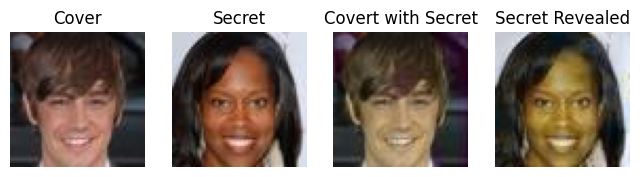

Test Image ::  4
1/1 [==============================] - 0s 440ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9499053859751841
PSNR of original cover and cover with secret : 32.918492456815294
SSIM Index of Secret image and secret rev image: 0.9087153576469922
PSNR of original Secret and REv secret: 30.09445344228627


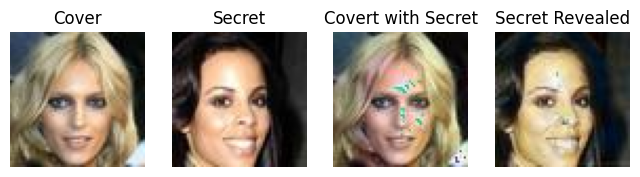

Test Image ::  5
1/1 [==============================] - 0s 460ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9754469778803041
PSNR of original cover and cover with secret : 30.305463865629356
SSIM Index of Secret image and secret rev image: 0.9655740849473364
PSNR of original Secret and REv secret: 29.781695823579696


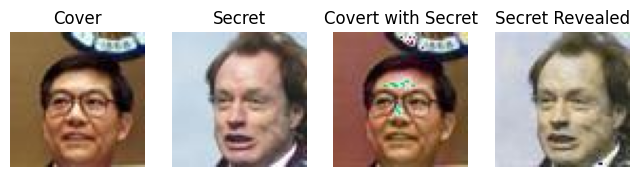

In [ ]:
for index in range(len(CoverImages)):
  print("Test Image :: ",index+1)
  cover = Image.open(CoverImages[index]).convert('RGB')
  secret = Image.open(SecretImages[index]).convert('RGB')

  revealed, cover_with_secret = complete_model.predict(
    [np.expand_dims(np.array(secret), axis=0), np.expand_dims(np.array(cover), axis=0)])
  cover_with_secret_img = Image.fromarray(np.array(cover_with_secret[0], dtype=np.uint8), 'RGB')
  secret_rev_img = Image.fromarray(np.array(revealed[0], dtype=np.uint8), 'RGB')



  cover_with_secret_img.save(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg')
  secret_rev_img.save(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg')

  ## Cover Image Related Values
  image1_path = CoverImages[index]
  image2_path = f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Cover image and Cover with secret secret image:", ssim_index)

  original = Image.open(CoverImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original cover and cover with secret :", psnr_value)

  ## Secret Image Related Values
  image1_path = SecretImages[index]
  image2_path = f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Secret image and secret rev image:", ssim_index)

  original = Image.open(SecretImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original Secret and REv secret:", psnr_value)

  #Ploting Images

  plot_paths = [CoverImages[index],SecretImages[index],f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg',f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg']#,f'/content/secret_rev_image{index}.jpg'
  fig, axes = plt.subplots(1, 4, figsize=(8, 8))
  labels = ["Cover", "Secret", "Covert with Secret", "Secret Revealed"]
  for i, (image_path,label) in enumerate(zip(plot_paths,labels)):

    image = mpimg.imread(image_path)

    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(label,fontsize=12)


  plt.show()













In [ ]:
original = Image.open(SecretImages[0]).convert('RGB')
enhanced = Image.open('/content/secret_rev_image0.jpg').convert('RGB')
enhanced = enhanced.resize((64,64))
psnr_value = psnr(original, enhanced)
print("PSNR of original Secret and secret with SRGAN :", psnr_value)

PSNR of original Secret and secret with SRGAN : 30.026874613387157


In [ ]:
original = Image.open(SecretImages[1]).convert('RGB')
enhanced = Image.open('/content/secret_rev_image1.jpg').convert('RGB')
# enhanced = enhanced.resize((64,64))
psnr_value = psnr(original, enhanced)
print("PSNR of original Secret and secret with SRGAN :", psnr_value)

PSNR of original Secret and secret with SRGAN : 28.193249051007513


In [ ]:
original = Image.open(SecretImages[2]).convert('RGB')
enhanced = Image.open('/content/secret_rev_image2.jpg').convert('RGB')
#enhanced = enhanced.resize((64,64))
psnr_value = psnr(original, enhanced)
print("PSNR of original Secret and secret with SRGAN :", psnr_value)

PSNR of original Secret and secret with SRGAN : 29.849568130364577


In [ ]:
original = Image.open(SecretImages[3]).convert('RGB')
enhanced = Image.open('/content/secret_rev_image3.jpg').convert('RGB')
#enhanced = enhanced.resize((64,64))
#original = original.resize((256,256))
psnr_value = psnr(original, enhanced)
print("PSNR of original Secret and secret with SRGAN :", psnr_value)

PSNR of original Secret and secret with SRGAN : 29.60929896691024


In [ ]:
original = Image.open(SecretImages[4]).convert('RGB')
enhanced = Image.open('/content/secret_rev_image4.jpg').convert('RGB')
#enhanced = enhanced.resize((64,64))
# original = original.resize((256,256))
psnr_value = psnr(original, enhanced)
print("PSNR of original Secret and secret with SRGAN :", psnr_value)

PSNR of original Secret and secret with SRGAN : 29.504741500753045


New Testing celeb

In [ ]:
CoverImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Cover')
SecretImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Secret')

In [ ]:
CoverImages

['/content/drive/MyDrive/Testing Images/Cover/141038.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/141049.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/141046.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/141036.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/141041.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/141033.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140714.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140717.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140991.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140995.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140986.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140718.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140988.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140719.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140998.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/140712.jpg',
 '/content/drive/MyDrive/Testing Images/Cover/141037.jpg

In [ ]:
SecretImages

['/content/drive/MyDrive/Testing Images/Secret/140977.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140976.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140965.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140962.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140963.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140959.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140969.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140956.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140971.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140973.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140954.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140946.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140939.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140933.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140941.jpg',
 '/content/drive/MyDrive/Testing Images/Secret/140937.jpg',
 '/content/drive/MyDrive/Testing Images/

Test Image ::  1
1/1 [==============================] - 0s 435ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9931076165751688
PSNR of original cover and cover with secret : 30.089423711053808
SSIM Index of Secret image and secret rev image: 0.9503013376380111
PSNR of original Secret and REv secret: 30.116640325307973


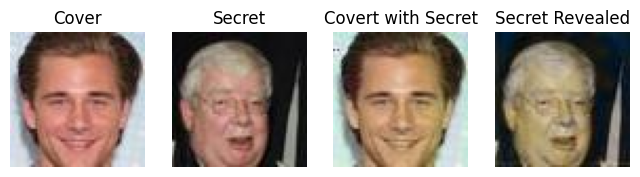

Test Image ::  2
1/1 [==============================] - 0s 480ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9795979251520271
PSNR of original cover and cover with secret : 29.84842897663676
SSIM Index of Secret image and secret rev image: 0.9166574959734192
PSNR of original Secret and REv secret: 29.750238805048703


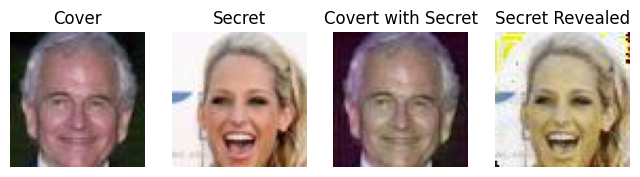

Test Image ::  3
1/1 [==============================] - 0s 452ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9919341136759309
PSNR of original cover and cover with secret : 31.999811179857986
SSIM Index of Secret image and secret rev image: 0.9676082838371665
PSNR of original Secret and REv secret: 30.060094434871814


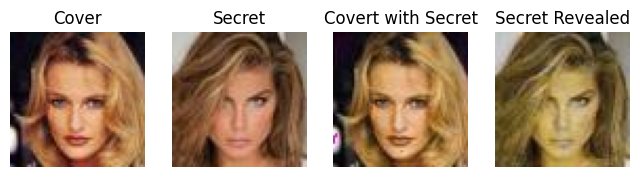

Test Image ::  4
1/1 [==============================] - 0s 445ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9912756130998354
PSNR of original cover and cover with secret : 33.05276738452538
SSIM Index of Secret image and secret rev image: 0.9036588330148625
PSNR of original Secret and REv secret: 30.04237960957413


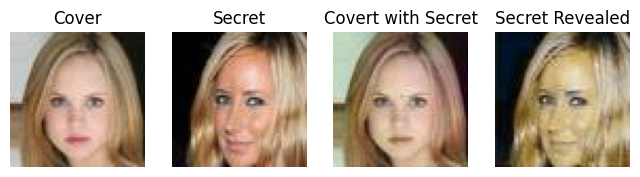

Test Image ::  5
1/1 [==============================] - 0s 448ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9611151446102058
PSNR of original cover and cover with secret : 31.364194912332657
SSIM Index of Secret image and secret rev image: 0.9658948169489875
PSNR of original Secret and REv secret: 29.890687840412646


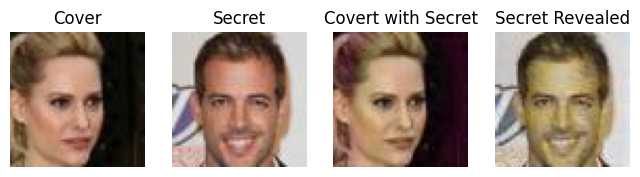

Test Image ::  6
1/1 [==============================] - 0s 425ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9233476994891371
PSNR of original cover and cover with secret : 32.553243608688454
SSIM Index of Secret image and secret rev image: 0.9574109040024996
PSNR of original Secret and REv secret: 30.198014434845835


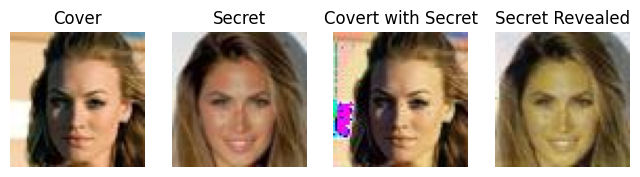

Test Image ::  7
1/1 [==============================] - 1s 856ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.97506836984409
PSNR of original cover and cover with secret : 32.3755219118867
SSIM Index of Secret image and secret rev image: 0.9715329272474832
PSNR of original Secret and REv secret: 29.832742230509645


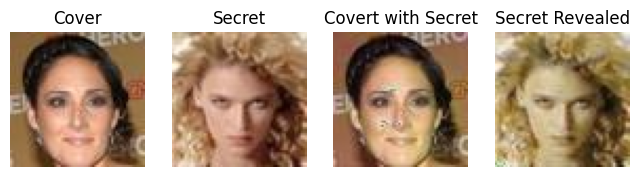

Test Image ::  8
1/1 [==============================] - 1s 647ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8344374504489142
PSNR of original cover and cover with secret : 30.65583333559832
SSIM Index of Secret image and secret rev image: 0.8883026686012223
PSNR of original Secret and REv secret: 29.083231806550806


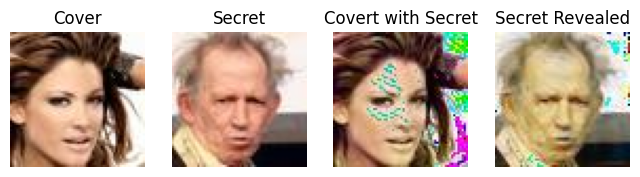

Test Image ::  9
1/1 [==============================] - 0s 428ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9523607601658415
PSNR of original cover and cover with secret : 30.225315506870707
SSIM Index of Secret image and secret rev image: 0.9422467515576131
PSNR of original Secret and REv secret: 29.514451345709123


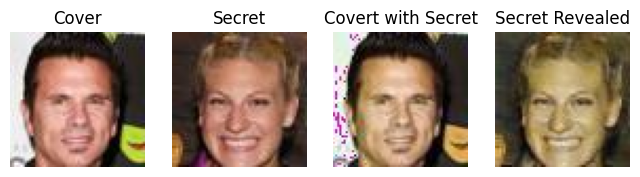

Test Image ::  10
1/1 [==============================] - 0s 438ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8617194152158418
PSNR of original cover and cover with secret : 30.397286020510386
SSIM Index of Secret image and secret rev image: 0.9555542187448324
PSNR of original Secret and REv secret: 30.256968059328038


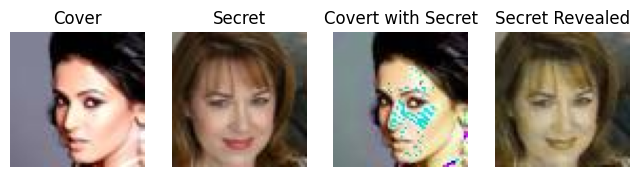

Test Image ::  11
1/1 [==============================] - 0s 463ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9925599393493514
PSNR of original cover and cover with secret : 32.10201185585389
SSIM Index of Secret image and secret rev image: 0.8646062240300896
PSNR of original Secret and REv secret: 29.19553108364308


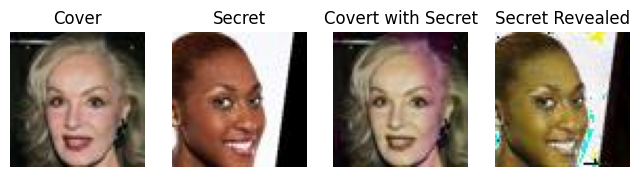

Test Image ::  12
1/1 [==============================] - 0s 462ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9919757598418774
PSNR of original cover and cover with secret : 34.0439028207146
SSIM Index of Secret image and secret rev image: 0.9551076245312602
PSNR of original Secret and REv secret: 30.41190267772184


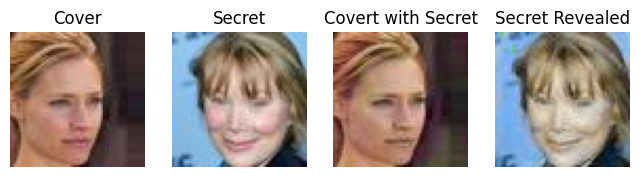

Test Image ::  13
1/1 [==============================] - 0s 459ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8903961008257432
PSNR of original cover and cover with secret : 32.119508859408505
SSIM Index of Secret image and secret rev image: 0.8908057704587985
PSNR of original Secret and REv secret: 29.097293560986866


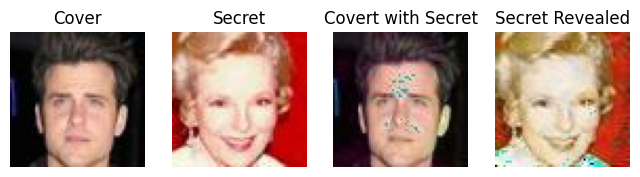

Test Image ::  14
1/1 [==============================] - 0s 493ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9359674585351773
PSNR of original cover and cover with secret : 30.558682533478315
SSIM Index of Secret image and secret rev image: 0.9335817826394003
PSNR of original Secret and REv secret: 30.158300691045778


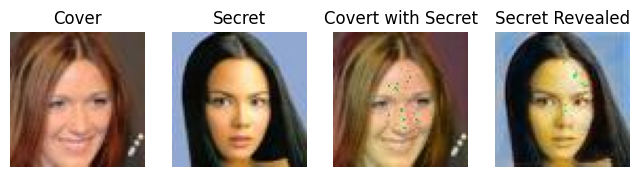

Test Image ::  15
1/1 [==============================] - 1s 817ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9947720565607379
PSNR of original cover and cover with secret : 31.49978455672405
SSIM Index of Secret image and secret rev image: 0.9169026708608178
PSNR of original Secret and REv secret: 29.563496025710116


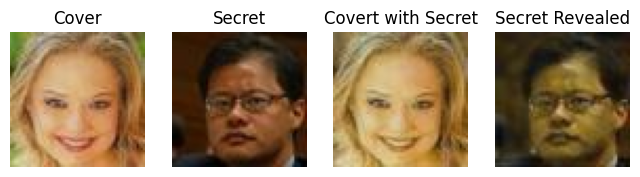

Test Image ::  16
1/1 [==============================] - 1s 794ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9353954679044955
PSNR of original cover and cover with secret : 33.42810498835134
SSIM Index of Secret image and secret rev image: 0.9536970454547384
PSNR of original Secret and REv secret: 30.55296227118301


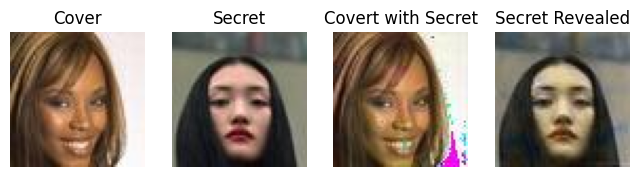

Test Image ::  17
1/1 [==============================] - 0s 465ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.952718919468282
PSNR of original cover and cover with secret : 30.83800062483375
SSIM Index of Secret image and secret rev image: 0.9679519176214844
PSNR of original Secret and REv secret: 30.709931496276397


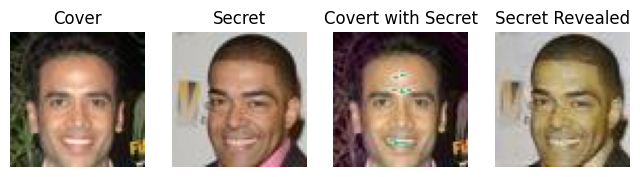

Test Image ::  18
1/1 [==============================] - 0s 419ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9919310590021428
PSNR of original cover and cover with secret : 28.637749473348528
SSIM Index of Secret image and secret rev image: 0.95334055637151
PSNR of original Secret and REv secret: 30.29236892065076


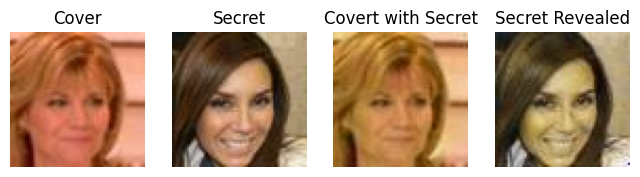

Test Image ::  19
1/1 [==============================] - 0s 433ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.5577595999946743
PSNR of original cover and cover with secret : 28.99387639717862
SSIM Index of Secret image and secret rev image: 0.9787573171810818
PSNR of original Secret and REv secret: 31.560534684187907


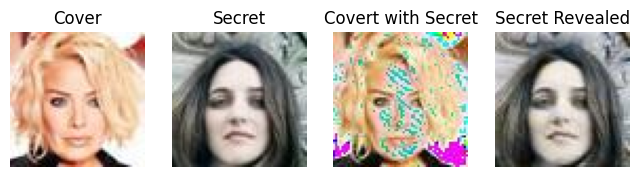

Test Image ::  20
1/1 [==============================] - 0s 444ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.978754803077722
PSNR of original cover and cover with secret : 31.4028222413587
SSIM Index of Secret image and secret rev image: 0.9573678682223424
PSNR of original Secret and REv secret: 30.246727134849223


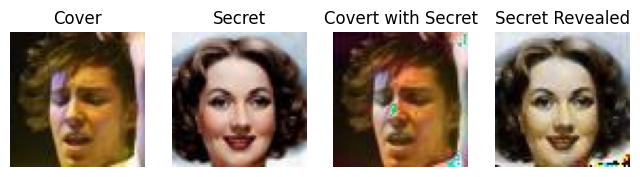

Test Image ::  21
1/1 [==============================] - 0s 448ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9942323188656783
PSNR of original cover and cover with secret : 34.017023694778274
SSIM Index of Secret image and secret rev image: 0.9570887028665618
PSNR of original Secret and REv secret: 29.379625523967864


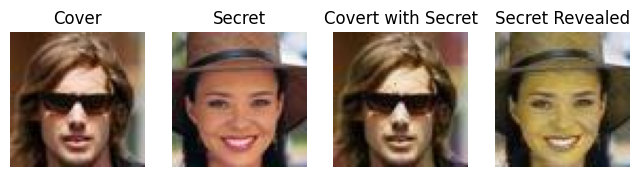

Test Image ::  22
1/1 [==============================] - 0s 463ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9940548110355892
PSNR of original cover and cover with secret : 33.10673691388478
SSIM Index of Secret image and secret rev image: 0.8740551739064155
PSNR of original Secret and REv secret: 29.77905018812148


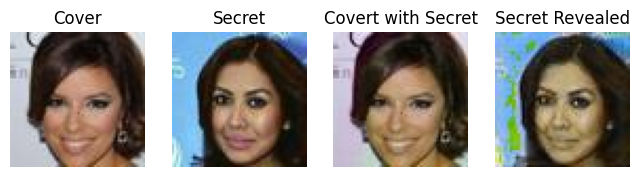

Test Image ::  23
1/1 [==============================] - 1s 822ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.7708931503440197
PSNR of original cover and cover with secret : 31.110624953854202
SSIM Index of Secret image and secret rev image: 0.951397927300597
PSNR of original Secret and REv secret: 30.037810019834765


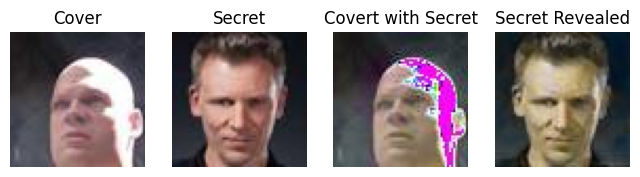

Test Image ::  24
1/1 [==============================] - 1s 747ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9864159137717107
PSNR of original cover and cover with secret : 32.38799407902387
SSIM Index of Secret image and secret rev image: 0.9402839557003086
PSNR of original Secret and REv secret: 29.19043074212269


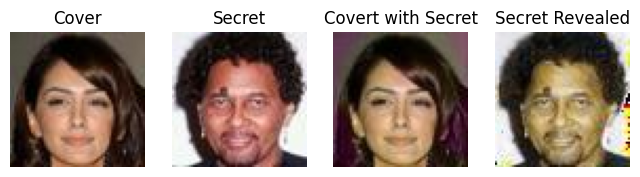

Test Image ::  25
1/1 [==============================] - 0s 446ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9872307151375744
PSNR of original cover and cover with secret : 33.65090043115994
SSIM Index of Secret image and secret rev image: 0.9455155988259879
PSNR of original Secret and REv secret: 29.22258609393105


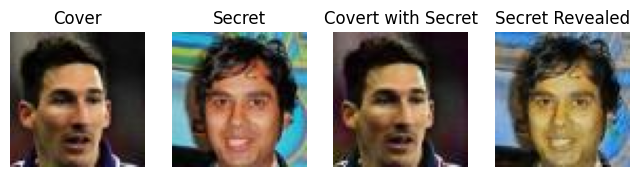

Test Image ::  26
1/1 [==============================] - 0s 463ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9910822424177156
PSNR of original cover and cover with secret : 33.47667977252376
SSIM Index of Secret image and secret rev image: 0.9631389448320287
PSNR of original Secret and REv secret: 29.945770759042098


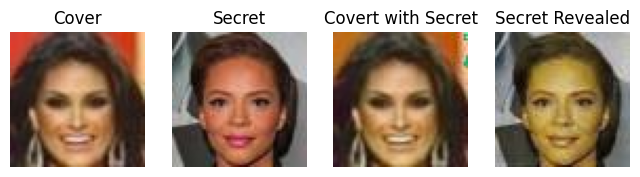

Test Image ::  27
1/1 [==============================] - 0s 428ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.97220023044932
PSNR of original cover and cover with secret : 33.36776297232965
SSIM Index of Secret image and secret rev image: 0.9435339985991199
PSNR of original Secret and REv secret: 30.603037704086272


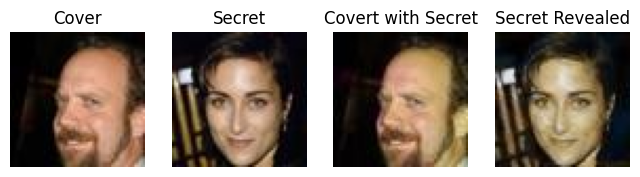

Test Image ::  28
1/1 [==============================] - 0s 441ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9899379873525601
PSNR of original cover and cover with secret : 33.01136105493044
SSIM Index of Secret image and secret rev image: 0.9288940421160671
PSNR of original Secret and REv secret: 30.036790335590695


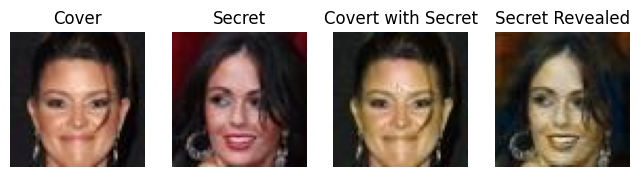

Test Image ::  29
1/1 [==============================] - 0s 455ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9914065782808046
PSNR of original cover and cover with secret : 33.82361102256872
SSIM Index of Secret image and secret rev image: 0.9291229117009597
PSNR of original Secret and REv secret: 29.391704470888513


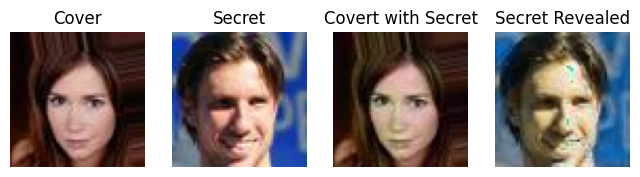

Test Image ::  30
1/1 [==============================] - 0s 440ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9600019175541665
PSNR of original cover and cover with secret : 32.37032165659087
SSIM Index of Secret image and secret rev image: 0.9416529648406176
PSNR of original Secret and REv secret: 29.6853907698883


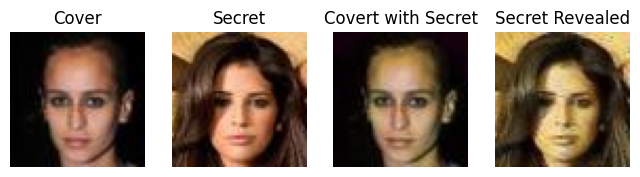

In [ ]:
for index in range(len(CoverImages)):
  print("Test Image :: ",index+1)
  cover = Image.open(CoverImages[index]).convert('RGB')
  secret = Image.open(SecretImages[index]).convert('RGB')

  revealed, cover_with_secret = complete_model.predict(
    [np.expand_dims(np.array(secret), axis=0), np.expand_dims(np.array(cover), axis=0)])
  cover_with_secret_img = Image.fromarray(np.array(cover_with_secret[0], dtype=np.uint8), 'RGB')
  secret_rev_img = Image.fromarray(np.array(revealed[0], dtype=np.uint8), 'RGB')



  cover_with_secret_img.save(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg')
  secret_rev_img.save(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg')

  ## Cover Image Related Values
  image1_path = CoverImages[index]
  image2_path = f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Cover image and Cover with secret secret image:", ssim_index)

  original = Image.open(CoverImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original cover and cover with secret :", psnr_value)

  ## Secret Image Related Values
  image1_path = SecretImages[index]
  image2_path = f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Secret image and secret rev image:", ssim_index)

  original = Image.open(SecretImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original Secret and REv secret:", psnr_value)

  #Ploting Images

  plot_paths = [CoverImages[index],SecretImages[index],f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg',f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg']#,f'/content/secret_rev_image{index}.jpg'
  fig, axes = plt.subplots(1, 4, figsize=(8, 8))
  labels = ["Cover", "Secret", "Covert with Secret", "Secret Revealed"]
  for i, (image_path,label) in enumerate(zip(plot_paths,labels)):

    image = mpimg.imread(image_path)

    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(label,fontsize=12)


  plt.show()




Cats+ Celeb Data Set

In [ ]:
CoverImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Cover')
SecretImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Secret')

In [ ]:
SecretImages

In [ ]:
CoverImages

Test Image ::  1
1/1 [==============================] - 0s 462ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9259486135645743
PSNR of original cover and cover with secret : 31.712984398500343
SSIM Index of Secret image and secret rev image: 0.9613690524023585
PSNR of original Secret and REv secret: 30.400658399609526


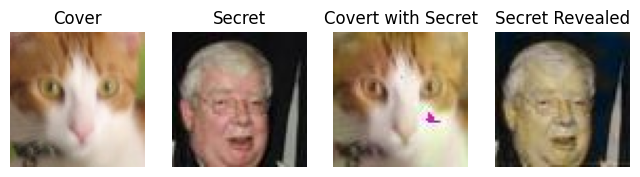

Test Image ::  2
1/1 [==============================] - 0s 425ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9216700132875765
PSNR of original cover and cover with secret : 29.830295306558696
SSIM Index of Secret image and secret rev image: 0.9206599453089628
PSNR of original Secret and REv secret: 29.626251892609574


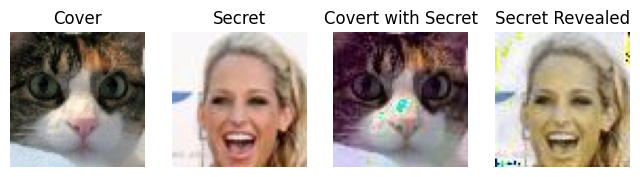

Test Image ::  3
1/1 [==============================] - 0s 421ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9182625010641546
PSNR of original cover and cover with secret : 32.357900066031874
SSIM Index of Secret image and secret rev image: 0.9680981424359358
PSNR of original Secret and REv secret: 29.8310010085315


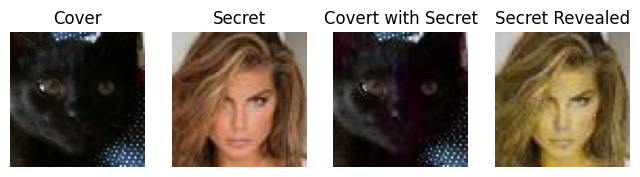

Test Image ::  4
1/1 [==============================] - 1s 505ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9025217669189655
PSNR of original cover and cover with secret : 30.241230732653797
SSIM Index of Secret image and secret rev image: 0.9071731754288672
PSNR of original Secret and REv secret: 30.039592301016953


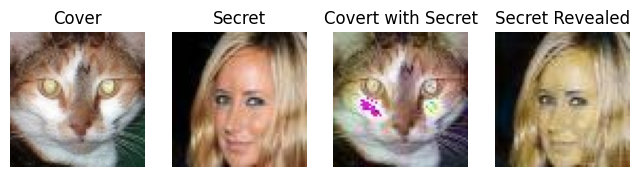

Test Image ::  5
1/1 [==============================] - 1s 827ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9504639619631048
PSNR of original cover and cover with secret : 30.573282928872636
SSIM Index of Secret image and secret rev image: 0.959868656854486
PSNR of original Secret and REv secret: 29.609487742432215


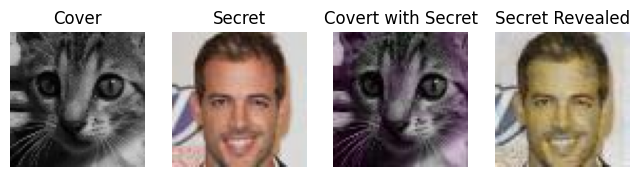

Test Image ::  6
1/1 [==============================] - 0s 446ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9366939658932522
PSNR of original cover and cover with secret : 31.627100630281284
SSIM Index of Secret image and secret rev image: 0.9647148704761073
PSNR of original Secret and REv secret: 29.975194737399566


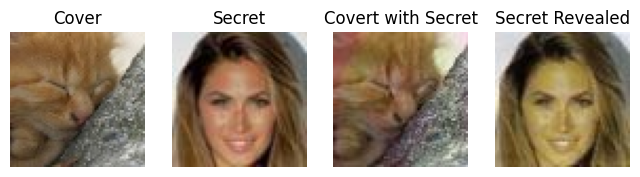

Test Image ::  7
1/1 [==============================] - 0s 429ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8814132748336219
PSNR of original cover and cover with secret : 30.315014448454995
SSIM Index of Secret image and secret rev image: 0.9699791017167453
PSNR of original Secret and REv secret: 29.564031854000334


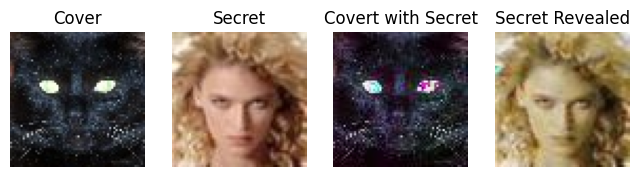

Test Image ::  8
1/1 [==============================] - 0s 430ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.891983896264131
PSNR of original cover and cover with secret : 30.154029898604982
SSIM Index of Secret image and secret rev image: 0.9146751962695135
PSNR of original Secret and REv secret: 29.0680180133648


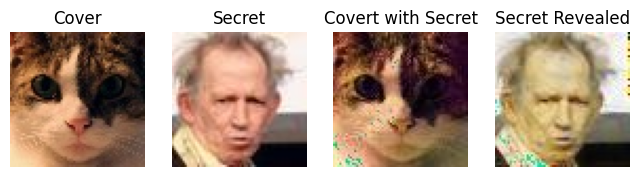

Test Image ::  9
1/1 [==============================] - 0s 433ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9723154994416102
PSNR of original cover and cover with secret : 32.54539360077815
SSIM Index of Secret image and secret rev image: 0.959389946371613
PSNR of original Secret and REv secret: 29.536231651135285


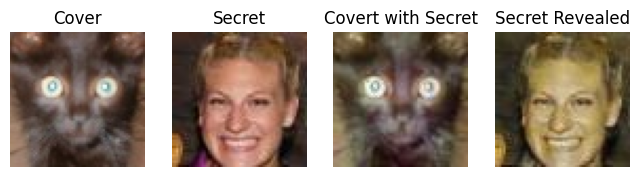

Test Image ::  10
1/1 [==============================] - 0s 444ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9394889020829924
PSNR of original cover and cover with secret : 30.64007137712169
SSIM Index of Secret image and secret rev image: 0.9645685346386941
PSNR of original Secret and REv secret: 30.603805896543633


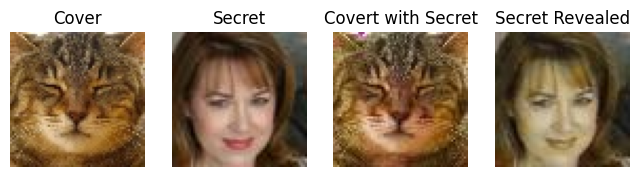

Test Image ::  11
1/1 [==============================] - 0s 442ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9156371583463647
PSNR of original cover and cover with secret : 30.551295793843806
SSIM Index of Secret image and secret rev image: 0.8481435707193201
PSNR of original Secret and REv secret: 28.885289350279955


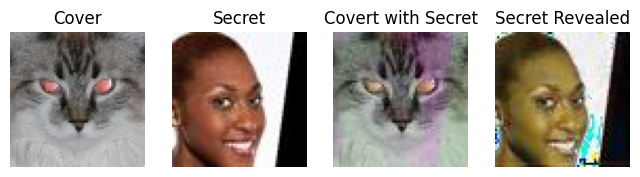

Test Image ::  12
1/1 [==============================] - 0s 438ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9382492923906081
PSNR of original cover and cover with secret : 29.23569842986702
SSIM Index of Secret image and secret rev image: 0.9534667218626234
PSNR of original Secret and REv secret: 30.281272947171022


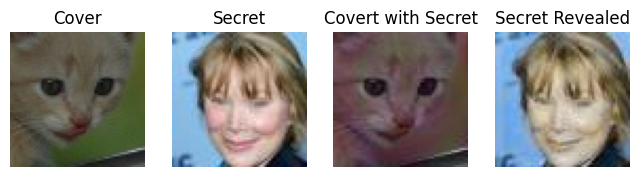

Test Image ::  13
1/1 [==============================] - 0s 432ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9552499121541005
PSNR of original cover and cover with secret : 30.857735956332476
SSIM Index of Secret image and secret rev image: 0.8829962360704411
PSNR of original Secret and REv secret: 28.784524749926565


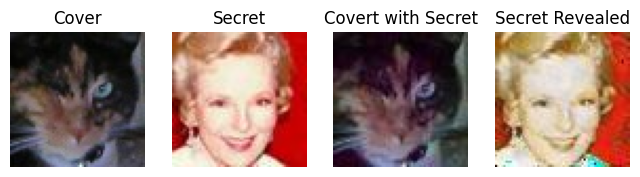

Test Image ::  14
1/1 [==============================] - 1s 680ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.3670376544898717
PSNR of original cover and cover with secret : 28.92289175311342
SSIM Index of Secret image and secret rev image: 0.8916159331772484
PSNR of original Secret and REv secret: 29.776044800639426


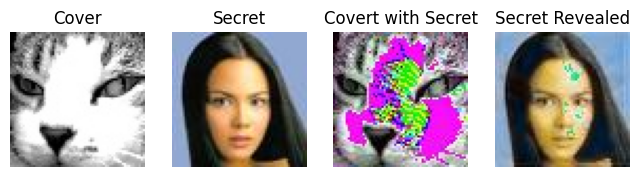

Test Image ::  15
1/1 [==============================] - 1s 715ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9433956832470215
PSNR of original cover and cover with secret : 32.99474595246358
SSIM Index of Secret image and secret rev image: 0.930254912710871
PSNR of original Secret and REv secret: 29.87587788598628


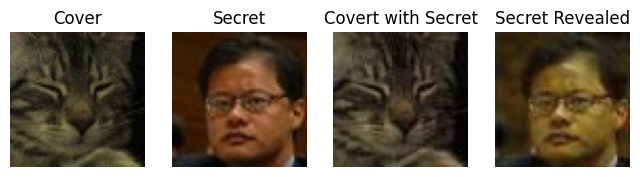

Test Image ::  16
1/1 [==============================] - 0s 484ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8937860651306585
PSNR of original cover and cover with secret : 31.524907691512478
SSIM Index of Secret image and secret rev image: 0.9545758456195426
PSNR of original Secret and REv secret: 30.760183644134173


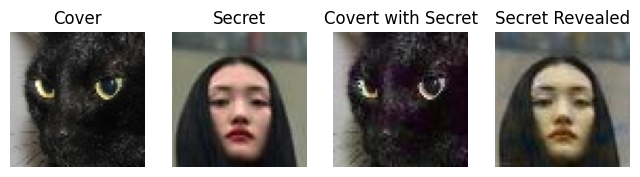

Test Image ::  17
1/1 [==============================] - 0s 464ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9551012868401828
PSNR of original cover and cover with secret : 30.312472970368344
SSIM Index of Secret image and secret rev image: 0.9664414819402565
PSNR of original Secret and REv secret: 30.555111118986392


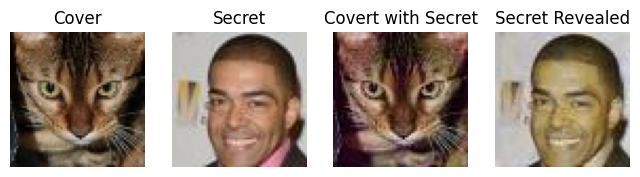

Test Image ::  18
1/1 [==============================] - 0s 437ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9242916256870629
PSNR of original cover and cover with secret : 30.490787276493037
SSIM Index of Secret image and secret rev image: 0.9563342041831991
PSNR of original Secret and REv secret: 30.093231559132434


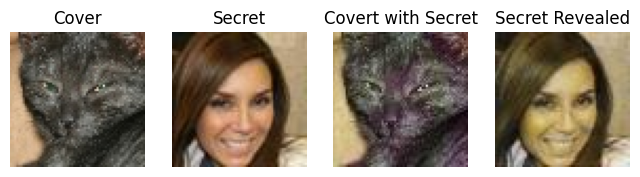

Test Image ::  19
1/1 [==============================] - 0s 434ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.7795240302484872
PSNR of original cover and cover with secret : 29.71249668820709
SSIM Index of Secret image and secret rev image: 0.9790294779792199
PSNR of original Secret and REv secret: 31.69744974637057


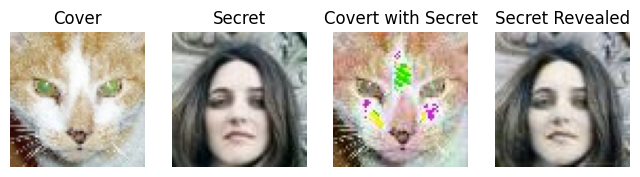

Test Image ::  20
1/1 [==============================] - 0s 450ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9429687157559602
PSNR of original cover and cover with secret : 30.245973555346186
SSIM Index of Secret image and secret rev image: 0.9455709548764788
PSNR of original Secret and REv secret: 29.82496703918685


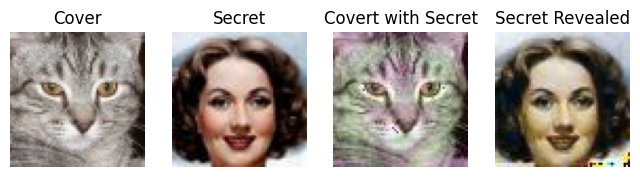

Test Image ::  21
1/1 [==============================] - 0s 441ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.6944128738705985
PSNR of original cover and cover with secret : 30.250295469319084
SSIM Index of Secret image and secret rev image: 0.9589385534736723
PSNR of original Secret and REv secret: 29.239373887258353


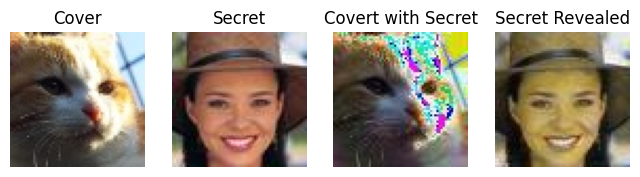

Test Image ::  22
1/1 [==============================] - 0s 435ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.6109547776930032
PSNR of original cover and cover with secret : 29.353516074410333
SSIM Index of Secret image and secret rev image: 0.8794211107616642
PSNR of original Secret and REv secret: 29.43663846248907


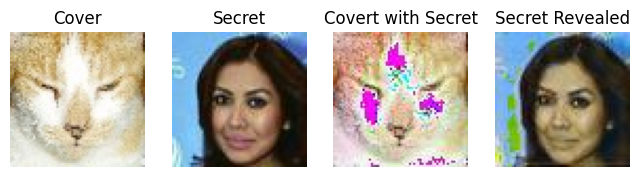

Test Image ::  23
1/1 [==============================] - 0s 491ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.889262967867186
PSNR of original cover and cover with secret : 28.49074383863794
SSIM Index of Secret image and secret rev image: 0.949003422036815
PSNR of original Secret and REv secret: 29.83740984721066


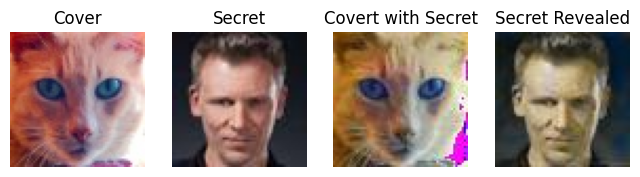

Test Image ::  24
1/1 [==============================] - 1s 803ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9363029448349024
PSNR of original cover and cover with secret : 30.99353760784053
SSIM Index of Secret image and secret rev image: 0.93387986439197
PSNR of original Secret and REv secret: 29.235520664026993


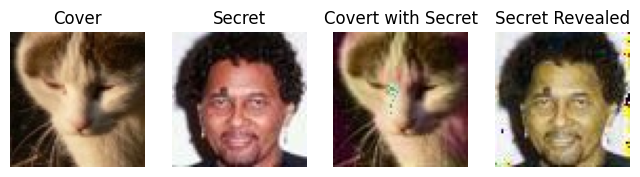

Test Image ::  25
1/1 [==============================] - 0s 431ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9165732692102074
PSNR of original cover and cover with secret : 30.711147767160533
SSIM Index of Secret image and secret rev image: 0.9438527571334431
PSNR of original Secret and REv secret: 29.152542313454354


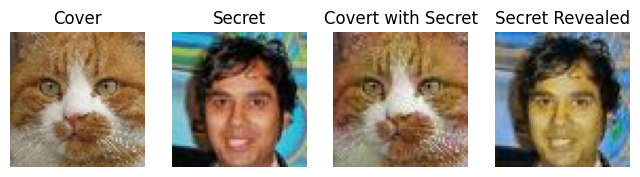

Test Image ::  26
1/1 [==============================] - 0s 428ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9294513572164593
PSNR of original cover and cover with secret : 30.34118745712474
SSIM Index of Secret image and secret rev image: 0.9666351109664797
PSNR of original Secret and REv secret: 30.03367246457443


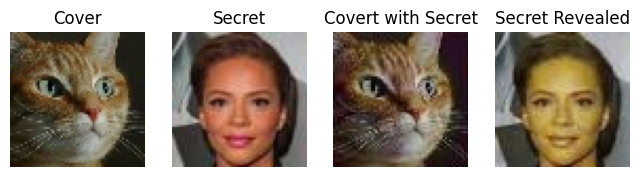

Test Image ::  27
1/1 [==============================] - 0s 446ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9255030373664485
PSNR of original cover and cover with secret : 32.290927619496884
SSIM Index of Secret image and secret rev image: 0.9463936795653652
PSNR of original Secret and REv secret: 30.510268223746525


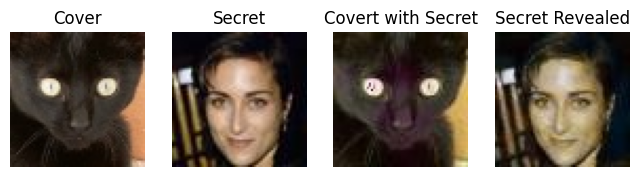

Test Image ::  28
1/1 [==============================] - 0s 447ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.900456175538769
PSNR of original cover and cover with secret : 29.343598299830795
SSIM Index of Secret image and secret rev image: 0.9215796818398365
PSNR of original Secret and REv secret: 29.78159244819065


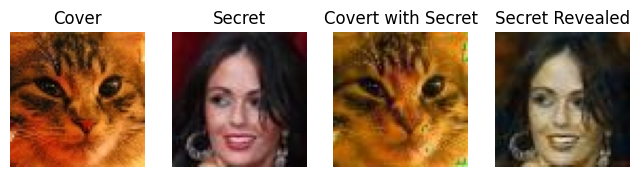

Test Image ::  29
1/1 [==============================] - 0s 450ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9178390804622366
PSNR of original cover and cover with secret : 29.327818722801968
SSIM Index of Secret image and secret rev image: 0.9285757140179721
PSNR of original Secret and REv secret: 29.36470071029792


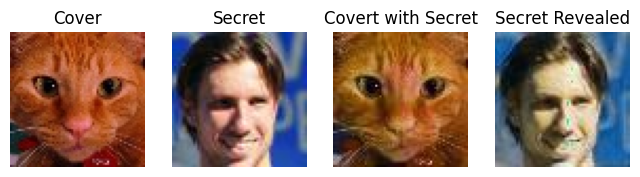

Test Image ::  30
1/1 [==============================] - 0s 451ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8981255332428477
PSNR of original cover and cover with secret : 32.079677704852195
SSIM Index of Secret image and secret rev image: 0.9367615599360816
PSNR of original Secret and REv secret: 29.68412203142053


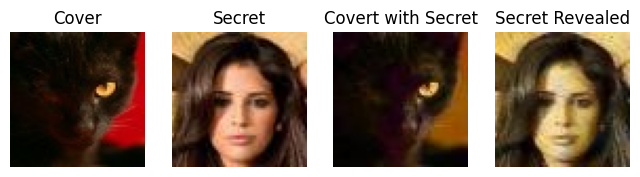

In [ ]:
for index in range(len(CoverImages)):
  print("Test Image :: ",index+1)
  cover = Image.open(CoverImages[index]).convert('RGB')
  secret = Image.open(SecretImages[index]).convert('RGB')

  revealed, cover_with_secret = complete_model.predict(
    [np.expand_dims(np.array(secret), axis=0), np.expand_dims(np.array(cover), axis=0)])
  cover_with_secret_img = Image.fromarray(np.array(cover_with_secret[0], dtype=np.uint8), 'RGB')
  secret_rev_img = Image.fromarray(np.array(revealed[0], dtype=np.uint8), 'RGB')



  cover_with_secret_img.save(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg')
  secret_rev_img.save(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg')

  ## Cover Image Related Values
  image1_path = CoverImages[index]
  image2_path = f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Cover image and Cover with secret secret image:", ssim_index)

  original = Image.open(CoverImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original cover and cover with secret :", psnr_value)

  ## Secret Image Related Values
  image1_path = SecretImages[index]
  image2_path = f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Secret image and secret rev image:", ssim_index)

  original = Image.open(SecretImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original Secret and REv secret:", psnr_value)

  #Ploting Images

  plot_paths = [CoverImages[index],SecretImages[index],f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg',f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg']#,f'/content/secret_rev_image{index}.jpg'
  fig, axes = plt.subplots(1, 4, figsize=(8, 8))
  labels = ["Cover", "Secret", "Covert with Secret", "Secret Revealed"]
  for i, (image_path,label) in enumerate(zip(plot_paths,labels)):

    image = mpimg.imread(image_path)

    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(label,fontsize=12)


  plt.show()




Cats data set

In [ ]:
CoverImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Cover')
SecretImages = ImagePathMapping('/content/drive/MyDrive/Testing Images/Secret')

Test Image ::  1
1/1 [==============================] - 0s 449ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9237277797158858
PSNR of original cover and cover with secret : 31.999165179395824
SSIM Index of Secret image and secret rev image: 0.8999611554424046
PSNR of original Secret and REv secret: 29.478160464751582


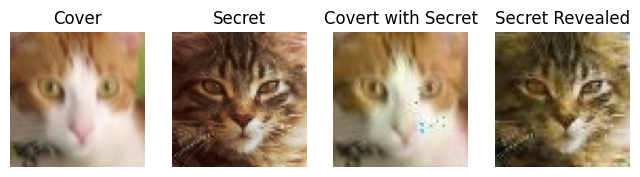

Test Image ::  2
1/1 [==============================] - 0s 438ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9239989121784089
PSNR of original cover and cover with secret : 31.11544979700986
SSIM Index of Secret image and secret rev image: 0.8974462438518027
PSNR of original Secret and REv secret: 29.93420772806987


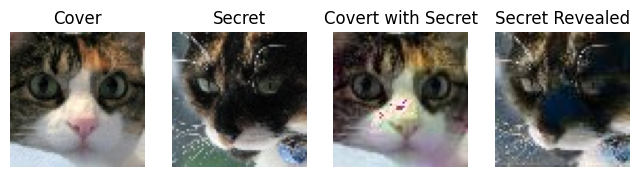

Test Image ::  3
1/1 [==============================] - 0s 426ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8981389055693989
PSNR of original cover and cover with secret : 30.5904599419746
SSIM Index of Secret image and secret rev image: 0.9063302769117636
PSNR of original Secret and REv secret: 29.54352588018017


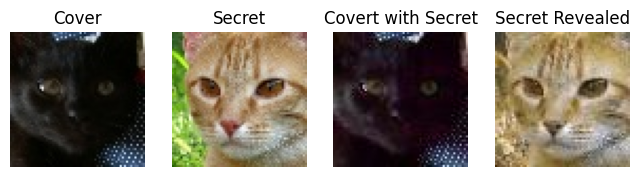

Test Image ::  4
1/1 [==============================] - 0s 419ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9252735858884872
PSNR of original cover and cover with secret : 30.183299591116175
SSIM Index of Secret image and secret rev image: 0.9085288361894475
PSNR of original Secret and REv secret: 30.49431225339907


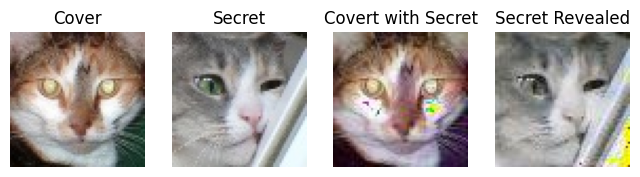

Test Image ::  5
1/1 [==============================] - 0s 425ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9511718416771048
PSNR of original cover and cover with secret : 31.315542641948916
SSIM Index of Secret image and secret rev image: 0.9185284619118443
PSNR of original Secret and REv secret: 29.66983264651455


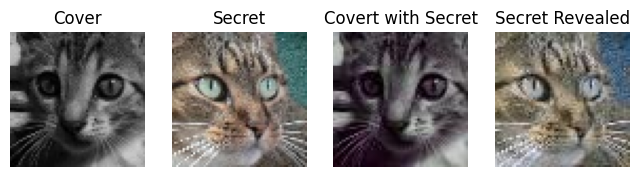

Test Image ::  6
1/1 [==============================] - 0s 421ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9396530964867541
PSNR of original cover and cover with secret : 32.269206785945165
SSIM Index of Secret image and secret rev image: 0.8786516345357246
PSNR of original Secret and REv secret: 30.5567296315468


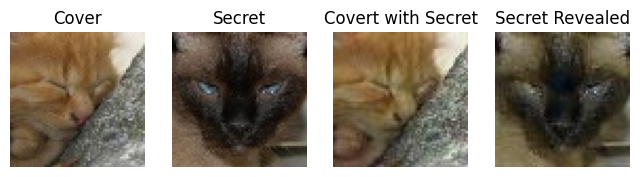

Test Image ::  7
1/1 [==============================] - 0s 459ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8777677097588436
PSNR of original cover and cover with secret : 29.79976742195167
SSIM Index of Secret image and secret rev image: 0.9017614113483768
PSNR of original Secret and REv secret: 30.6599188134194


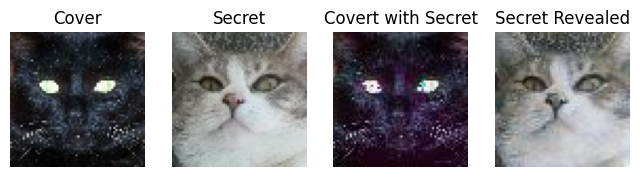

Test Image ::  8
1/1 [==============================] - 1s 767ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8987397621652427
PSNR of original cover and cover with secret : 30.624291109848247
SSIM Index of Secret image and secret rev image: 0.9469690307985937
PSNR of original Secret and REv secret: 29.21880221570898


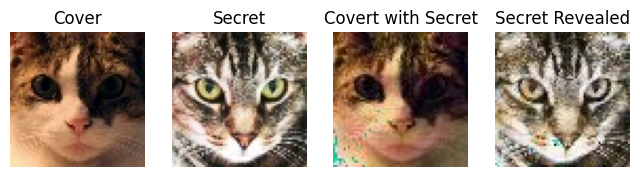

Test Image ::  9
1/1 [==============================] - 1s 793ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9711470433732378
PSNR of original cover and cover with secret : 33.72729698118516
SSIM Index of Secret image and secret rev image: 0.914889496537395
PSNR of original Secret and REv secret: 29.95831202780448


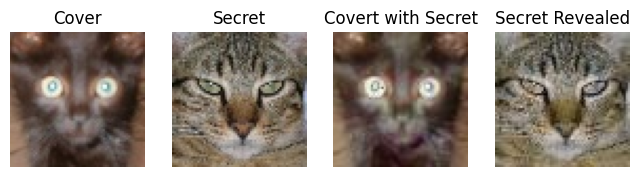

Test Image ::  10
1/1 [==============================] - 0s 443ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9359912644099376
PSNR of original cover and cover with secret : 29.86743993430366
SSIM Index of Secret image and secret rev image: 0.9100037890791526
PSNR of original Secret and REv secret: 29.260254327320816


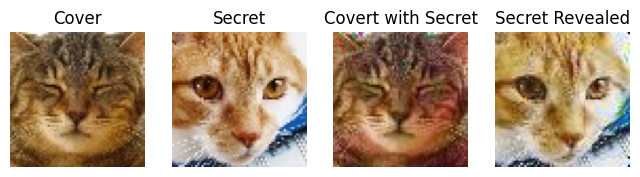

Test Image ::  11
1/1 [==============================] - 0s 442ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9214066988136261
PSNR of original cover and cover with secret : 31.042072231933915
SSIM Index of Secret image and secret rev image: 0.897299938920112
PSNR of original Secret and REv secret: 31.34399449377


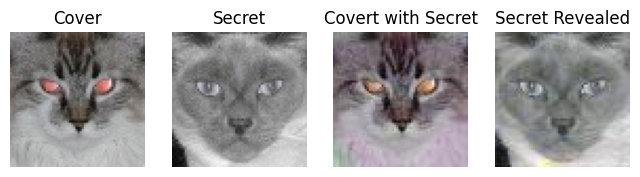

Test Image ::  12
1/1 [==============================] - 0s 443ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9355232419308099
PSNR of original cover and cover with secret : 30.44059255309467
SSIM Index of Secret image and secret rev image: 0.9284696701074139
PSNR of original Secret and REv secret: 29.675352099965544


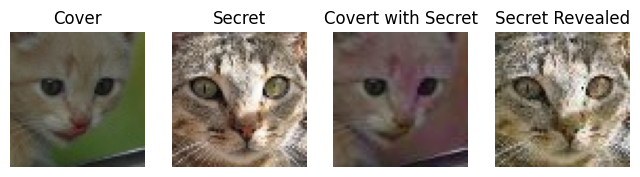

Test Image ::  13
1/1 [==============================] - 0s 434ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9644434685005165
PSNR of original cover and cover with secret : 33.000631561635245
SSIM Index of Secret image and secret rev image: 0.9104994412509714
PSNR of original Secret and REv secret: 30.463143486735014


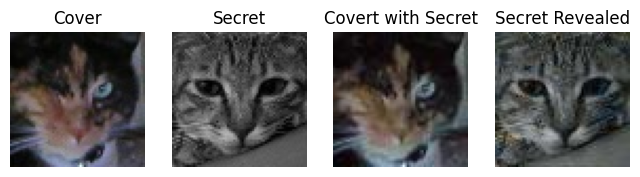

Test Image ::  14
1/1 [==============================] - 0s 449ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.42879755565049626
PSNR of original cover and cover with secret : 28.976605141767866
SSIM Index of Secret image and secret rev image: 0.8721825512434107
PSNR of original Secret and REv secret: 29.630043742251758


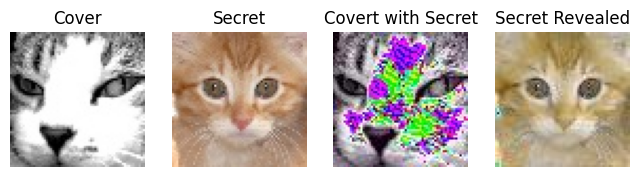

Test Image ::  15
1/1 [==============================] - 0s 435ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9411142609497043
PSNR of original cover and cover with secret : 30.74491651337357
SSIM Index of Secret image and secret rev image: 0.9119549189557616
PSNR of original Secret and REv secret: 30.053761378696713


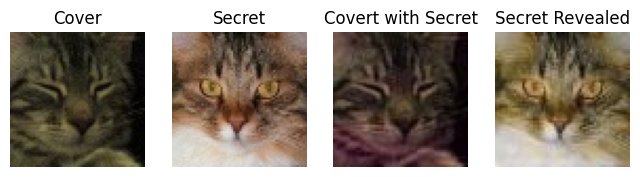

Test Image ::  16
1/1 [==============================] - 0s 456ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.896893064640197
PSNR of original cover and cover with secret : 31.42158684144954
SSIM Index of Secret image and secret rev image: 0.8939079998759071
PSNR of original Secret and REv secret: 30.108234513276525


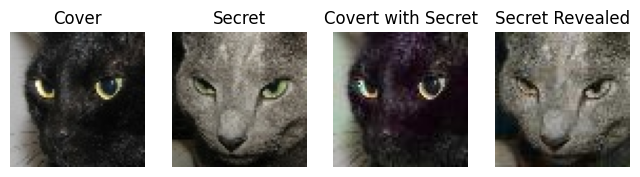

Test Image ::  17
1/1 [==============================] - 0s 432ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9552322864814593
PSNR of original cover and cover with secret : 29.954954105576896
SSIM Index of Secret image and secret rev image: 0.8840249982065299
PSNR of original Secret and REv secret: 28.812386877748168


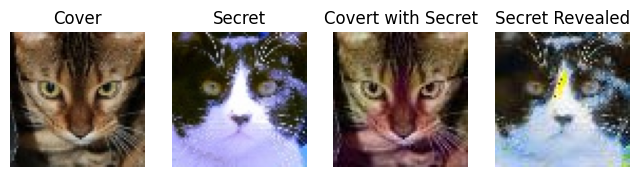

Test Image ::  18
1/1 [==============================] - 1s 813ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9262601784221045
PSNR of original cover and cover with secret : 30.949007300748185
SSIM Index of Secret image and secret rev image: 0.8977708325518192
PSNR of original Secret and REv secret: 30.08030068912479


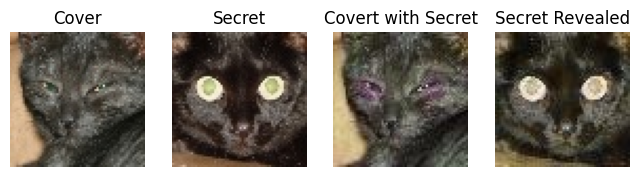

Test Image ::  19
1/1 [==============================] - 1s 725ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.7168939428274596
PSNR of original cover and cover with secret : 29.754006980216943
SSIM Index of Secret image and secret rev image: 0.9123112741980179
PSNR of original Secret and REv secret: 29.881655114255608


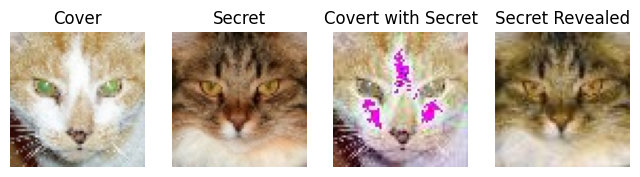

Test Image ::  20
1/1 [==============================] - 0s 433ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9504899241274796
PSNR of original cover and cover with secret : 30.53946984842003
SSIM Index of Secret image and secret rev image: 0.90047159275321
PSNR of original Secret and REv secret: 29.61728438013821


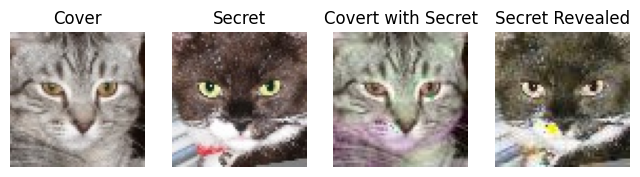

Test Image ::  21
1/1 [==============================] - 0s 451ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.7071408620501661
PSNR of original cover and cover with secret : 29.53941281433549
SSIM Index of Secret image and secret rev image: 0.9017286089613606
PSNR of original Secret and REv secret: 29.145915774412877


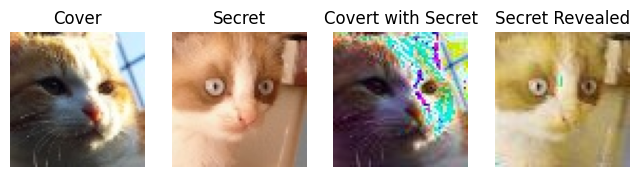

Test Image ::  22
1/1 [==============================] - 0s 440ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.6317362344622903
PSNR of original cover and cover with secret : 28.8877583055729
SSIM Index of Secret image and secret rev image: 0.860936699516065
PSNR of original Secret and REv secret: 30.6487529383286


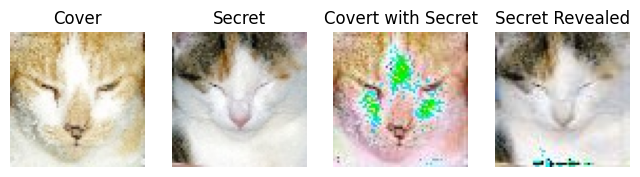

Test Image ::  23
1/1 [==============================] - 0s 414ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.881347374966346
PSNR of original cover and cover with secret : 29.469276825648947
SSIM Index of Secret image and secret rev image: 0.8884852587608695
PSNR of original Secret and REv secret: 29.793004429731344


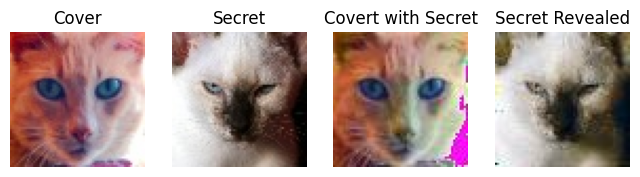

Test Image ::  24
1/1 [==============================] - 0s 428ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9629462832471843
PSNR of original cover and cover with secret : 32.317500114786114
SSIM Index of Secret image and secret rev image: 0.8943340609194095
PSNR of original Secret and REv secret: 31.00088186628128


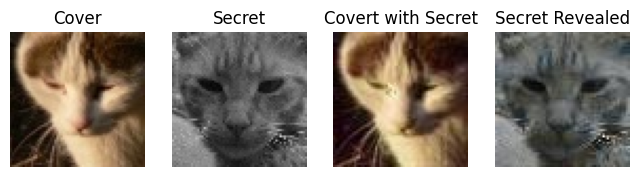

Test Image ::  25
1/1 [==============================] - 0s 444ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9172188466542373
PSNR of original cover and cover with secret : 30.711147767160533
SSIM Index of Secret image and secret rev image: 0.9228196830607985
PSNR of original Secret and REv secret: 31.197687115486584


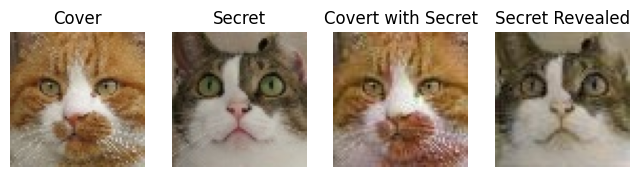

Test Image ::  26
1/1 [==============================] - 0s 452ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9303583679709871
PSNR of original cover and cover with secret : 30.769264634561104
SSIM Index of Secret image and secret rev image: 0.8932544872797978
PSNR of original Secret and REv secret: 31.138227599585004


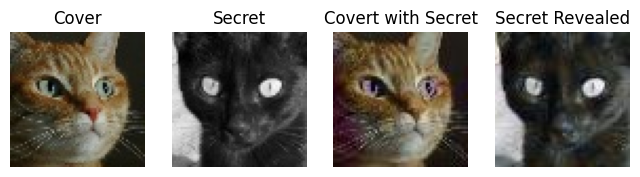

Test Image ::  27
1/1 [==============================] - 0s 446ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9292966745699762
PSNR of original cover and cover with secret : 33.467648276942576
SSIM Index of Secret image and secret rev image: 0.8581582521342667
PSNR of original Secret and REv secret: 29.59442642262531


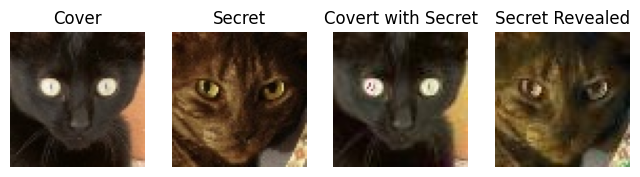

Test Image ::  28
1/1 [==============================] - 1s 794ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8987450194938608
PSNR of original cover and cover with secret : 29.046271954685608
SSIM Index of Secret image and secret rev image: 0.7655676316745341
PSNR of original Secret and REv secret: 30.323204028704986


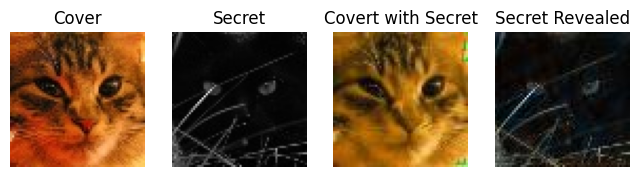

Test Image ::  29
1/1 [==============================] - 1s 746ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.9211157100091601
PSNR of original cover and cover with secret : 30.025584114348064
SSIM Index of Secret image and secret rev image: 0.8993438006817379
PSNR of original Secret and REv secret: 30.52668185934869


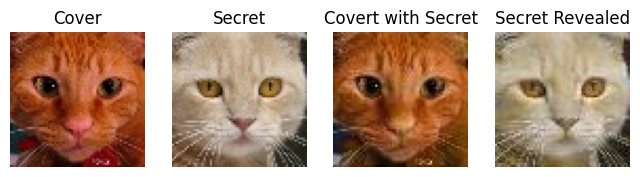

Test Image ::  30
1/1 [==============================] - 0s 458ms/step
SSIM Index of Cover image and Cover with secret secret image: 0.8787428667200758
PSNR of original cover and cover with secret : 31.2532474124297
SSIM Index of Secret image and secret rev image: 0.8710481905236631
PSNR of original Secret and REv secret: 29.322323570533474


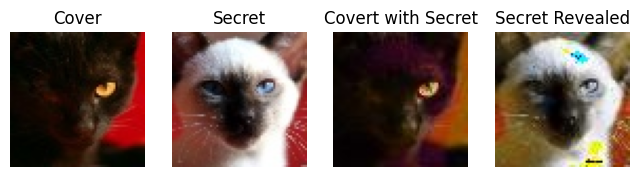

In [ ]:
for index in range(len(CoverImages)):
  print("Test Image :: ",index+1)
  cover = Image.open(CoverImages[index]).convert('RGB')
  secret = Image.open(SecretImages[index]).convert('RGB')

  revealed, cover_with_secret = complete_model.predict(
    [np.expand_dims(np.array(secret), axis=0), np.expand_dims(np.array(cover), axis=0)])
  cover_with_secret_img = Image.fromarray(np.array(cover_with_secret[0], dtype=np.uint8), 'RGB')
  secret_rev_img = Image.fromarray(np.array(revealed[0], dtype=np.uint8), 'RGB')



  cover_with_secret_img.save(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg')
  secret_rev_img.save(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg')

  ## Cover Image Related Values
  image1_path = CoverImages[index]
  image2_path = f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Cover image and Cover with secret secret image:", ssim_index)

  original = Image.open(CoverImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original cover and cover with secret :", psnr_value)

  ## Secret Image Related Values
  image1_path = SecretImages[index]
  image2_path = f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg'
  ssim_index = get_ssim_index(image1_path, image2_path)
  print("SSIM Index of Secret image and secret rev image:", ssim_index)

  original = Image.open(SecretImages[index]).convert('RGB')
  enhanced = Image.open(f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg').convert('RGB')

  psnr_value = psnr(original, enhanced)
  print("PSNR of original Secret and REv secret:", psnr_value)

  #Ploting Images

  plot_paths = [CoverImages[index],SecretImages[index],f'/content/drive/MyDrive/Cover_w_Secret/Cover_with_secret_image{index}.jpg',f'/content/drive/MyDrive/Revealed/secret_rev_image{index}.jpg']#,f'/content/secret_rev_image{index}.jpg'
  fig, axes = plt.subplots(1, 4, figsize=(8, 8))
  labels = ["Cover", "Secret", "Covert with Secret", "Secret Revealed"]
  for i, (image_path,label) in enumerate(zip(plot_paths,labels)):

    image = mpimg.imread(image_path)

    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(label,fontsize=12)


  plt.show()


